# Hotel Review EDA and Modelling

### Import Libraries

In [2]:
import pandas as pd

import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns

plt.style.use('fivethirtyeight')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [3]:
from scipy import sparse
from sklearn.pipeline import make_pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, TfidfTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer, make_column_transformer, make_column_selector
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.naive_bayes import MultinomialNB, BernoulliNB, GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix, classification_report, plot_confusion_matrix

import nltk
from nltk.tokenize import PunktSentenceTokenizer
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tag import pos_tag
import os
from wordcloud import WordCloud

import joblib

from sklearn import set_config
set_config(display='diagram')   

### Sections
1 Review EDA
- 1.1 [Load hotel and review data](#load_data)
- 1.1.1 [Baseline for full data-set](#baseline)

2 Initial Modelling on small Dataset
- 2.1 [Set-up data](#init_data_setup)
- 2.1.1 [Count-Vectorizer and log wordount histogram plot](#cvec_hist)
- 2.1.2 [Train-Test split](#tts)
- 2.2 [Naive Bayes on review_headline only](#nb_hd)
- 2.3 [General fitter function to show training and test scores](#fitter)
- 2.4 [Naive Bayes on combined review_headline and review_body](#nb_hd_bd)
- 2.5 [Simple Logistic Regression](#init_slr)
- 2.6 [Simple Logistic Regression with TF-IDF transformer](#init_slr_tfidf)

3.0 Modelling on Full Dataset
- 3.1 [Data set-up inc. stopwords options](#data_full_stop)
- 3.2 [Logistic Regression with GridSearch](#full_gs_lr)
- 3.3 [NaiveBayes with GridSearch](#full_gs_nb)
- 3.4 [Decision Tree Classifier with GridSearch](#full_gs_dtc)
- 3.3 [Random Forest Classifier](#full_rfc)

4.0 Modelling on full Dataset with Length
- 4.1 [Prepare the data](#data_full_len)
- 4.2 [Logistic Regression with GridSearch](#full_len_gs_lr)
- 4.3 [NaiveBayes with GridSearch](#full_len_gs_nb)

5.0 Analysis and review 
- 5.1 [Best Model Scores](#model_scores)
- 5.2 [Examples where the model gets things wrong](#examples_wrong)
- 5.3 [Wordcloud Examples](#wordcloud)
- 5.4 [Final results from best model](#best_final_results)
- 5.4.1 [Precision-Recall and ROC plots for best model](#best_pr_roc)

## 1 Review EDA

<a name="load_data"></a>
### 1.1 Load hotel and review data

In [4]:
# load in hotel dictionary data as dataframe
hotel_datasets = [file for file in os.listdir('data/') if 'Details_' in file]
df_hotel_dict = pd.DataFrame()
for dataset in hotel_datasets:
    df_dataset = pd.read_csv('data/' + dataset)
    df_hotel_dict = pd.concat([df_hotel_dict, df_dataset], ignore_index=True)

# drop duplicates
df_hotel_dict.drop_duplicates(inplace=True)

In [5]:
# create num english reviews count and approximate time to scrape reviews column
df_hotel_dict['num_reviews_english'] = df_hotel_dict.top_lang_reviews.apply(lambda x: eval(x)['English'])
df_hotel_dict['approx_time_scrape_hrs'] = (df_hotel_dict.num_reviews_english / 5 * 20)/3600

# convert star rating to float
df_hotel_dict.star_rating = df_hotel_dict.star_rating.apply(lambda x : np.nan if x == 'None' else float(x))

In [6]:
# create average room rate column
def avg_room_rate(x):
    list_x = eval(x)
    for i in range(len(list_x)):
        if '£' in list_x[i]:
            return np.mean([int(val) for val in list_x[i].replace('£', '').split() if val.isnumeric()])
    return np.nan

df_hotel_dict['avg_room_rate'] = df_hotel_dict.extra_details.apply(avg_room_rate)

C:\Users\mqsil\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [7]:
# load in review data and save as dataframe
review_datasets = [file for file in os.listdir('data/') if 'Reviews_' in file]
df_review_dict = pd.DataFrame()
for dataset in review_datasets:
    df_dataset = pd.read_csv('data/' + dataset)
    df_review_dict = pd.concat([df_review_dict, df_dataset], ignore_index=True)
    
# drop duplicates
df_review_dict.drop_duplicates(inplace=True)

In [8]:
# total no. reviews
len(df_review_dict)

305779

<a name="baseline"></a>
#### 1.1.1 Baseline for full dataset

In [9]:
# normalised value_counts to establish base-line
df_review_dict.review_score.value_counts(normalize=True)

5.0    0.372318
4.0    0.319652
3.0    0.154494
1.0    0.081510
2.0    0.072026
Name: review_score, dtype: float64

In [10]:
# proportion of reviews obtained in total
len(df_review_dict)/df_hotel_dict.num_reviews_english.sum()

0.35540283109767506

In [11]:
# convert review date to datetime function
def review_to_datetime(x):
    if x.startswith('Date'):
        return '/'.join(x.split(' ')[-2:])
    return np.nan

# convert null values to 'non' in review date column
df_review_dict.loc[df_review_dict[df_review_dict.review_date.isnull()].index, 'review_date'] = 'None'

# apply the function and create datetime column
df_review_dict['review_date_datetime'] = df_review_dict.review_date[df_review_dict.review_date.notnull()].apply(review_to_datetime)
df_review_dict['review_date_datetime'] = pd.to_datetime(df_review_dict.review_date_datetime)

# create year, month columns and join review body and title and review length
df_review_dict['review_year'] = df_review_dict.review_date_datetime.apply(lambda x: x.year)
df_review_dict['review_month'] = df_review_dict.review_date_datetime.apply(lambda x: x.month)
df_review_dict['review_title_body'] = df_review_dict.review_headline +  ' ' + df_review_dict.review
df_review_dict['review_length'] = df_review_dict.review_title_body.apply(lambda x : len(str(x)))

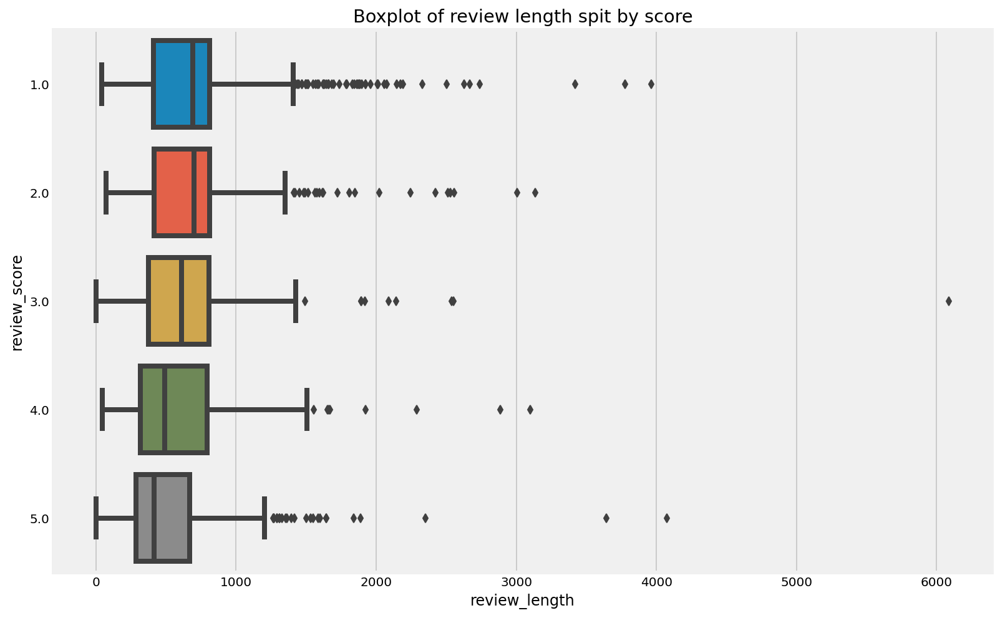

In [11]:
# boxplot review score and length of review
plt.figure(figsize=(12, 8))
sns.boxplot(x='review_length', y='review_score', data=df_review_dict, orient='h')
plt.title('Boxplot of review length spit by score')
plt.show()

In [12]:
# review_length metrics
df_review_dict.review_length.describe()

count    305779.000000
mean        530.753394
std         226.103792
min           3.000000
25%         314.000000
50%         499.000000
75%         799.000000
max        6089.000000
Name: review_length, dtype: float64

In [13]:
# review length mean, nedian and std split by review_score
df_review_dict.groupby('review_score')['review_length'].agg(['mean', 'std', 'median'])

,mean,std,median
review_score,,,
1.0,618.463008,229.120593,693
2.0,620.174401,220.711059,699
3.0,584.993311,222.278361,609
4.0,525.075136,221.381464,491
5.0,476.620912,215.421173,413


In [14]:
# pearson correlation review length and score
df_review_dict.review_score.corr(df_review_dict['review_length'])

-0.22555899672602073

In [15]:
# 'outliers' - reviews with length > 3500
df_review_dict[df_review_dict.review_length>3500]

,Unnamed: 0,link,hotel_name,review_headline,review,review_date,review_score,review_date_datetime,review_year,review_month,review_title_body,review_length
104741,0,/Hotel_Review-g186338-d193046-Reviews-or0-The_...,"The Dilly Hotel Reviews, London",Just OK,The good - the communal areas of this hotel ar...,Date of stay: May 2021,3.0,2021-05-01,2021.0,5.0,Just OK The good - the communal areas of this ...,6089
152373,3,/Hotel_Review-g186338-d242713-Reviews-or0-Holi...,Holiday Inn Express London - Hammersmith Hotel...,Hard to fault. Excellent property.,You really can always rely on the Holiday Inn ...,Date of stay: January 2021,5.0,2021-01-01,2021.0,1.0,Hard to fault. Excellent property. You really ...,3645
221178,2,/Hotel_Review-g186338-d289182-Reviews-or0-Holi...,Holiday Inn Express London-Limehouse Hotel Rev...,Gem of a property,If you don't mind me fractionally outside of c...,Date of stay: January 2021,5.0,2021-01-01,2021.0,1.0,Gem of a property If you don't mind me fractio...,4074
256405,1,/Hotel_Review-g186338-d736379-Reviews-or0-Euro...,Eurotraveller Hotel-Premier Tower Bridge Revie...,"Disaster, never again!","Photos provided. Awful stay, awful service. N...",Date of stay: January 2020,1.0,2020-01-01,2020.0,1.0,"Disaster, never again! Photos provided. Awful...",3964
289087,3,/Hotel_Review-g186338-d192100-Reviews-or0-OYO_...,"OYO Boston Court Hotel Reviews, London",I wish I could give it 0/5,"I’m an assistance dog user, and as stated unde...",Date of stay: December 2019,1.0,2019-12-01,2019.0,12.0,I wish I could give it 0/5 I’m an assistance d...,3779


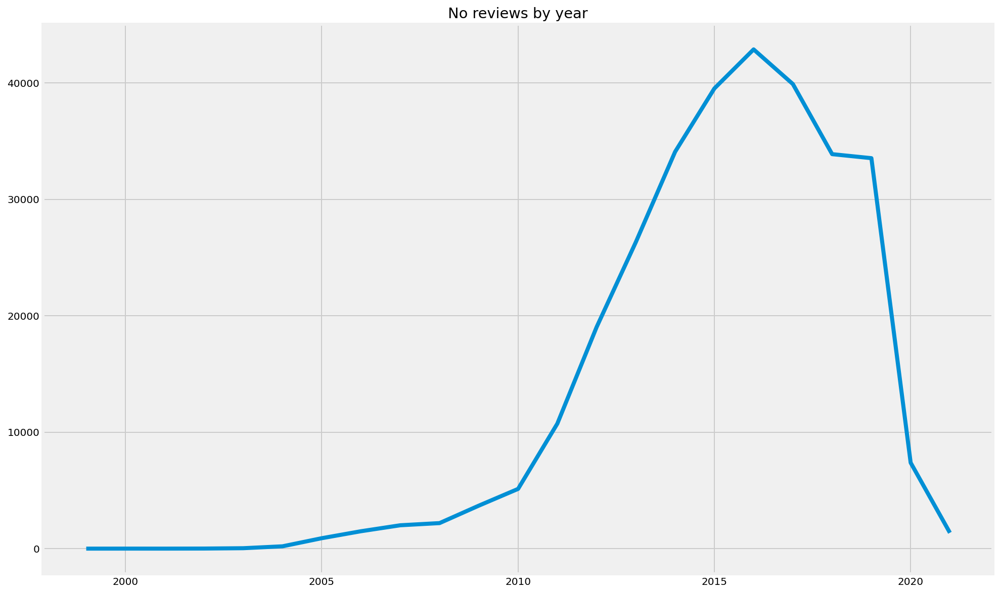

In [16]:
# plot no. reviews by year
plt.figure(figsize=(15, 10))
plt.plot(df_review_dict.review_year.value_counts().sort_index());
plt.title('No reviews by year')
plt.show()

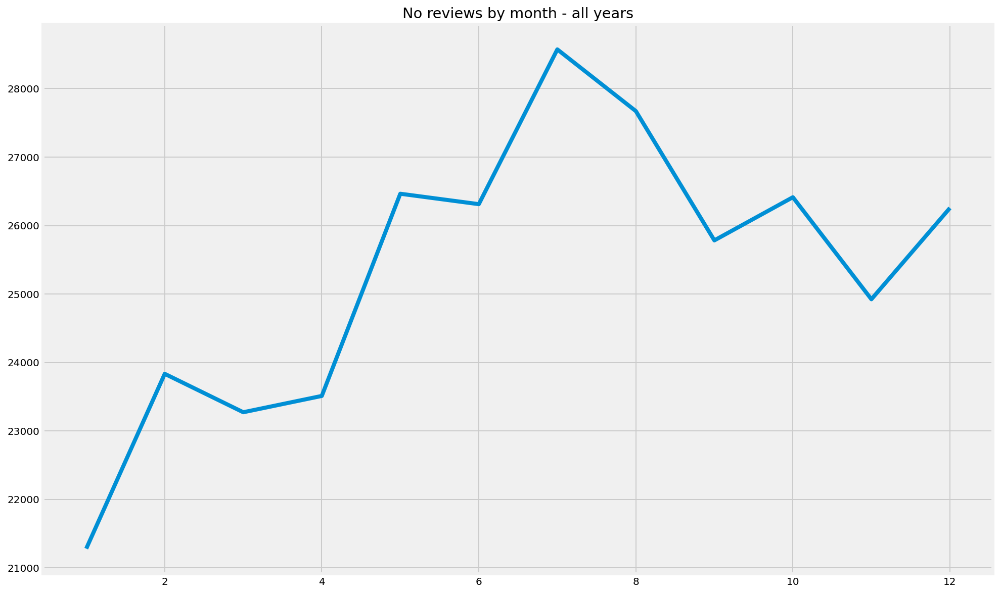

In [17]:
# plot no. reviews by month
plt.figure(figsize=(15, 10))
plt.plot(df_review_dict.review_month.value_counts().sort_index());
plt.title('No reviews by month - all years')
plt.show()

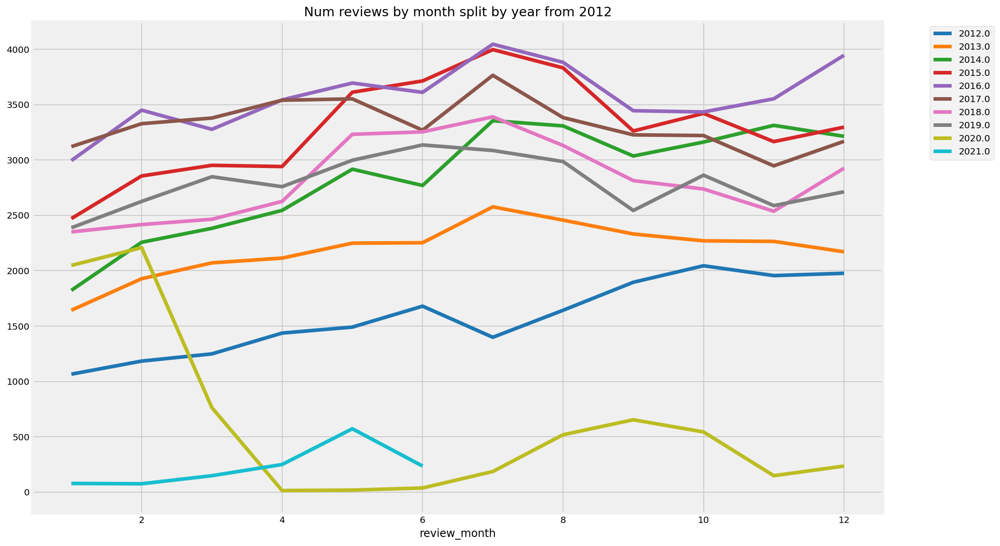

In [18]:
# plot no. reviews by month sploit by year from 2014
plot_data = df_review_dict[df_review_dict.review_year>2011].groupby(['review_year', 'review_month'])['review'].count()
plt.figure(figsize=(15, 10))
sns.lineplot(data=plot_data, x='review_month', hue='review_year', y=plot_data.values, palette='tab10')
plt.title('Num reviews by month split by year from 2012')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

In [19]:
# start initial modelling on marriot hotel subset of data
df_marriot = df_review_dict[df_review_dict.hotel_name.str.lower().str.contains('marriot')]
df_marriot.head()

,Unnamed: 0,link,hotel_name,review_headline,review,review_date,review_score,review_date_datetime,review_year,review_month,review_title_body,review_length
93559,0,/Hotel_Review-g186338-d195225-Reviews-or0-Lond...,London Marriott Hotel County Hall Reviews,A girls trip,Myself and three friends had the most lovely e...,Date of stay: June 2021,5.0,2021-06-01,2021.0,6.0,A girls trip Myself and three friends had the ...,326
93560,1,/Hotel_Review-g186338-d195225-Reviews-or0-Lond...,London Marriott Hotel County Hall Reviews,Another incredible stay,Another stay at this iconic Hotel - partly for...,Date of stay: May 2021,5.0,2021-05-01,2021.0,5.0,Another incredible stay Another stay at this i...,1127
93561,2,/Hotel_Review-g186338-d195225-Reviews-or0-Lond...,London Marriott Hotel County Hall Reviews,FOUR STAR AT A PUSH!,My review would have been a lot kinder if this...,Date of stay: May 2021,3.0,2021-05-01,2021.0,5.0,FOUR STAR AT A PUSH! My review would have been...,858
93562,3,/Hotel_Review-g186338-d195225-Reviews-or0-Lond...,London Marriott Hotel County Hall Reviews,"Great hotel, great staff.",This hotel is right beside the London Eye and ...,Date of stay: May 2021,5.0,2021-05-01,2021.0,5.0,"Great hotel, great staff. This hotel is right ...",446
93563,4,/Hotel_Review-g186338-d195225-Reviews-or0-Lond...,London Marriott Hotel County Hall Reviews,"A grand hotel, ticking over",Having an early appointment the following morn...,Date of stay: March 2021,4.0,2021-03-01,2021.0,3.0,"A grand hotel, ticking over Having an early ap...",1196


## 2.0 Initial Modelling on small Dataset

<a name="init_data_setup"></a>
### 2.1 Set-up data

In [20]:
# subset on 'review_headline' only for initial modelling
X_marriot = df_marriot[['review_headline', 'review_score']]
X_marriot = X_marriot.dropna()
y = X_marriot.pop('review_score')
X_marriot.head()

,review_headline
93559,A girls trip
93560,Another incredible stay
93561,FOUR STAR AT A PUSH!
93562,"Great hotel, great staff."
93563,"A grand hotel, ticking over"


In [21]:
# baseline score 0.477
y.value_counts(normalize=True)

5.0    0.476903
4.0    0.311935
3.0    0.123870
2.0    0.048742
1.0    0.038550
Name: review_score, dtype: float64

In [22]:
X_marriot.head()

,review_headline
93559,A girls trip
93560,Another incredible stay
93561,FOUR STAR AT A PUSH!
93562,"Great hotel, great staff."
93563,"A grand hotel, ticking over"


<a name="cvec_hist"></a>
#### 2.1.1 Count-Vectorizer and log wordount histogram plot

In [24]:
# set-up countvectorizer
cvec = CountVectorizer(token_pattern='\w+', stop_words='english', strip_accents='unicode')
cvec.fit(X_marriot.review_headline)

# convert sparse matrix and put into dataframe
dm = cvec.transform(X_marriot.review_headline)
df = pd.DataFrame(dm.toarray(), columns=cvec.get_feature_names())

In [25]:
# top 20 words
df.sum(axis=0).sort_values(ascending=False)[:20]

hotel         2852
great         2558
location      2438
stay          1300
good          1200
london        1083
service        896
excellent      863
staff          791
nice           687
marriott       611
lovely         353
perfect        341
fantastic      332
room           323
best           317
wonderful      297
amazing        271
place          266
experience     251
dtype: int64

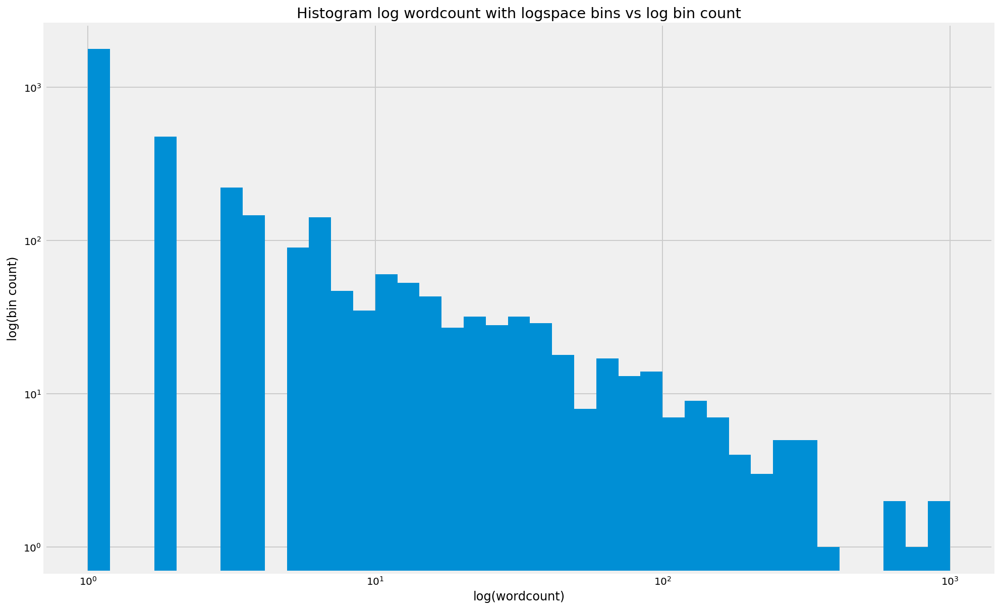

In [26]:
# Plot showings log histogram of word count and log bin-space for Marriot headline dataset
plt.figure(figsize=(15,10))
plt.hist(df.sum(axis=0).sort_values(ascending=False).values, bins=np.logspace(0, 3, 40))
plt.title('Histogram log wordcount with logspace bins vs log bin count' )
plt.xscale('log')
plt.xlabel('log(wordcount)')
plt.yscale('log')
plt.ylabel('log(bin count)')
plt.show()

This is a plot that shows nicely the skewed nature of how languages are generally used. There are a relatively small number of words used extensively and a large number of words used seldomly. 

<a name="tts"></a>
#### 2.1.2 Train-Test split

In [42]:
# train test split
X_marriot = X_marriot.review_headline
X_train, X_test, y_train, y_test = train_test_split(X_marriot, y, test_size=0.2, stratify=y, random_state=1)

<a name="nb_hd"></a>
### 2.2 Naive Bayes on review_headline only

In [43]:
# set-up pipeline using naive bayes
stopwords_to_use = stopwords.words(['english']) + ['hotel']
pipeline = Pipeline([
    ('vect', CountVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True)),
    #('tfidf', TfidfTransformer()),
    ('cls', MultinomialNB())
])

In [44]:
# pipeline.get_params()

In [1]:
# fit pipeline
pipeline.fit(X_train, y_train)

In [46]:
# train score
pipeline.score(X_train, y_train)

0.6922523633374434

In [47]:
# test accuracy score
pipeline.score(X_test, y_test)

0.604354971240756

In [48]:
# cv score
cross_val_score(pipeline, X_train, y_train, cv=5).mean()

0.5919660309612754

In [49]:
# confusion matrix test data
y_preds = pipeline.predict(X_test)
confusion_matrix(y_true=y_test, y_pred=y_preds, labels=[5, 4, 3, 2, 1])

array([[972, 175,  10,   4,   0],
       [372, 357,  28,   1,   1],
       [ 68, 106, 122,   5,   0],
       [ 39,  31,  39,   4,   6],
       [ 28,  14,  29,   7,  16]], dtype=int64)

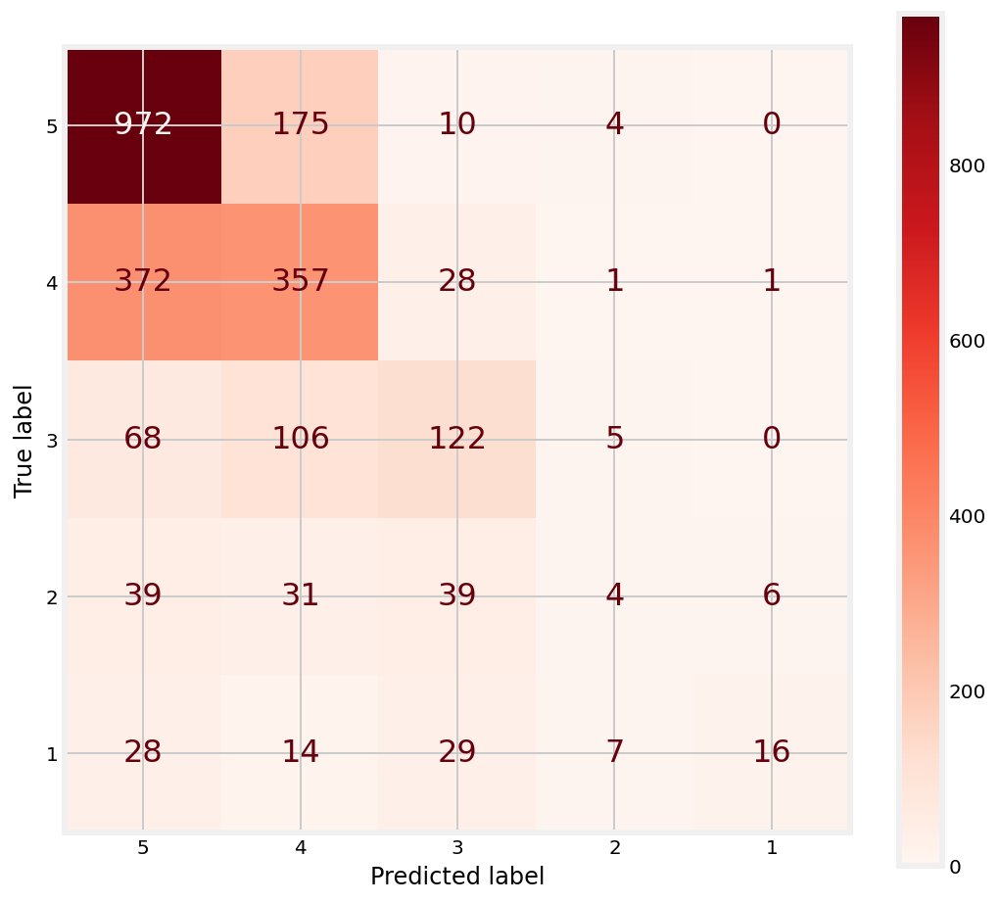

In [50]:
# using plot sklearn's plot_confusion_matrix
fig, ax = plt.subplots(figsize=(8, 8))
plot_confusion_matrix(pipeline, X_test, y_test, labels=[5, 4, 3, 2, 1], cmap='Reds', ax=ax)

texts = ax.texts
for text in texts:
    text.set_size(16)

plt.show()

In [51]:
# classification report
print(classification_report(y_true=y_test, y_pred=y_preds))

              precision    recall  f1-score   support

         1.0       0.70      0.17      0.27        94
         2.0       0.19      0.03      0.06       119
         3.0       0.54      0.41      0.46       301
         4.0       0.52      0.47      0.50       759
         5.0       0.66      0.84      0.74      1161

    accuracy                           0.60      2434
   macro avg       0.52      0.38      0.40      2434
weighted avg       0.58      0.60      0.58      2434



<a name="fitter"></a>
### 2.3 General function to show training and test scores

In [13]:
# set-up fitter function to ouput train and test scores
def fitter(model, X_train, y_train, X_test, y_test, cv_score=True):
    """
    Takes a model, training and test sets as inputs and evaluated the model on both 
    reporting scores, confusion matrix and classification report.
    """

    print(f'Training Score: {model.score(X_train, y_train)}')
    if cv_score:
        print(f'Avg CV Score: {cross_val_score(model, X_train, y_train, cv=5).mean()}')
    print(f'Test Score: {model.score(X_test, y_test)}')
    print()
    print(confusion_matrix(y_train, model.predict(X_train)))
    print()
    print(classification_report(y_train, model.predict(X_train)))
    print()
    print(confusion_matrix(y_test, model.predict(X_test)))
    print()
    print(classification_report(y_test, model.predict(X_test)))

In [53]:
fitter(pipeline, X_train, y_train, X_test, y_test)

Training Score: 0.6922523633374434
Avg CV Score: 0.5919660309612754
Test Score: 0.604354971240756

[[ 157   11   88   42   77]
 [  13  141  136   79  105]
 [   6    5  620  380  195]
 [   6    5  108 1773 1144]
 [  10    6   54  525 4046]]

              precision    recall  f1-score   support

         1.0       0.82      0.42      0.55       375
         2.0       0.84      0.30      0.44       474
         3.0       0.62      0.51      0.56      1206
         4.0       0.63      0.58      0.61      3036
         5.0       0.73      0.87      0.79      4641

    accuracy                           0.69      9732
   macro avg       0.73      0.54      0.59      9732
weighted avg       0.69      0.69      0.68      9732


[[ 16   7  29  14  28]
 [  6   4  39  31  39]
 [  0   5 122 106  68]
 [  1   1  28 357 372]
 [  0   4  10 175 972]]

              precision    recall  f1-score   support

         1.0       0.70      0.17      0.27        94
         2.0       0.19      0.03      0.06

<a name="nb_hd_bd"></a>
### 2.4 Naive Bayes on combined review_headline and review_body

In [54]:
# use review headline and body combined
X_marriot = df_marriot[['review_score', 'review_title_body']].dropna().drop_duplicates()
y = X_marriot.pop('review_score')
X_marriot = X_marriot.review_title_body

In [56]:
X_train, X_test, y_train, y_test = train_test_split(X_marriot, y, test_size=0.2, stratify=y, random_state=1)

In [20]:
stopwords_to_use = stopwords.words(['english']) + ['hotel']

pipeline_hb_MultiNB = Pipeline([
    ('vect', CountVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True)),
    #('tfidf', TfidfTransformer()),
    ('cls', MultinomialNB())
])

# pipeline_hb_MultiNB.fit(X_train, y_train)

In [63]:
fitter(pipeline_hb_MultiNB, X_train, y_train, X_test, y_test)

Training Score: 0.7897657213316893
Avg CV Score: 0.6301881673177857
Test Score: 0.6243321002877107

[[ 258    7   84   18    8]
 [   2  261  141   57   13]
 [   2    0  814  328   62]
 [   4    1   64 2371  596]
 [   8    5   22  624 3982]]

              precision    recall  f1-score   support

         1.0       0.94      0.69      0.80       375
         2.0       0.95      0.55      0.70       474
         3.0       0.72      0.67      0.70      1206
         4.0       0.70      0.78      0.74      3036
         5.0       0.85      0.86      0.86      4641

    accuracy                           0.79      9732
   macro avg       0.83      0.71      0.76      9732
weighted avg       0.80      0.79      0.79      9732


[[ 21  14  46  11   2]
 [  8   5  77  21   8]
 [  1   6 121 146  27]
 [  1   1  34 480 243]
 [  1   0   5 262 892]]

              precision    recall  f1-score   support

         1.0       0.66      0.22      0.33        94
         2.0       0.19      0.04      0.0

Slight improved score score using combined review_headline and review_body using NaiveBayes - not unexpected

<a name="init_slr"></a>
### 2.5 Simple Logistic Regression

In [64]:
# set-up lr pipeline
pipeline_hb_lr = Pipeline([
    ('vect', CountVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True)),
    # ('tfidf', TfidfTransformer()),
    # ('tfidf', TfidfVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True)),
    ('cls', LogisticRegression(max_iter=5000))
])

In [21]:
pipeline_hb_lr.fit(X_train, y_train)

In [66]:
fitter(pipeline_hb_lr, X_train, y_train, X_test, y_test)

Training Score: 0.9793464858199753
Avg CV Score: 0.6114860345929728
Test Score: 0.6169338265515824

[[ 375    0    0    0    0]
 [   0  474    0    0    0]
 [   0    0 1192   12    2]
 [   0    0    1 2908  127]
 [   0    0    0   59 4582]]

              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00       375
         2.0       1.00      1.00      1.00       474
         3.0       1.00      0.99      0.99      1206
         4.0       0.98      0.96      0.97      3036
         5.0       0.97      0.99      0.98      4641

    accuracy                           0.98      9732
   macro avg       0.99      0.99      0.99      9732
weighted avg       0.98      0.98      0.98      9732


[[ 42  10  28   8   6]
 [ 19  19  51  22   8]
 [ 17  16 132 103  33]
 [  4   2  79 406 268]
 [  3   5  19 231 902]]

              precision    recall  f1-score   support

         1.0       0.49      0.45      0.47        94
         2.0       0.37      0.16      0.2

<a name="init_slr_tfidf"></a>
### 2.6 Simple Logistic Regression with TF-IDF transformer

In [71]:
# log reg using tfidf
pipeline_hb_lr_tfidf = Pipeline([
    ('vect', CountVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True)),
    ('tfidf', TfidfTransformer()),
    # ('tfidf', TfidfVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True)),
    ('cls', LogisticRegression(max_iter=5000))
])

In [24]:
pipeline_hb_lr_tfidf.fit(X_train, y_train)

In [73]:
fitter(pipeline_hb_lr_tfidf, X_train, y_train, X_test, y_test)

Training Score: 0.8133990957665433
Avg CV Score: 0.6367646538723237
Test Score: 0.6383066173448417

[[ 269    6   59   23   18]
 [   8  239  119   72   36]
 [   2    3  811  291   99]
 [   2    2   38 2291  703]
 [   0    0    7  328 4306]]

              precision    recall  f1-score   support

         1.0       0.96      0.72      0.82       375
         2.0       0.96      0.50      0.66       474
         3.0       0.78      0.67      0.72      1206
         4.0       0.76      0.75      0.76      3036
         5.0       0.83      0.93      0.88      4641

    accuracy                           0.81      9732
   macro avg       0.86      0.72      0.77      9732
weighted avg       0.82      0.81      0.81      9732


[[ 29   9  33   8  15]
 [ 12   7  64  24  12]
 [  3   4 121 129  44]
 [  0   0  32 423 304]
 [  1   0   5 181 973]]

              precision    recall  f1-score   support

         1.0       0.64      0.31      0.42        94
         2.0       0.35      0.06      0.1

Improved score with TF-IDF for Logistic Regression. Lets move onto using the full data-set

## 3.0 Modelling on Full Dataset

<a name='data_full_stop'></a>
### 3.1 Data set-up inc. stopwords options

In [14]:
X_all = df_review_dict[['review_score','review_title_body']].dropna().drop_duplicates()

y = X_all.pop('review_score')
X_all = X_all.review_title_body

X_train, X_test, y_train, y_test = train_test_split(X_all, y, test_size=0.2, stratify=y, random_state=1)

In [17]:
# baseline of 0.37
y.value_counts(normalize=True)

5.0    0.372305
4.0    0.319617
3.0    0.154500
1.0    0.081528
2.0    0.072050
Name: review_score, dtype: float64

In [25]:
# set-up various stopwords options to be experimented with during modelling

# default only
stopwords_to_use_english_default = stopwords.words(['english'])

# default + 'hotel' (by far the most common word from initial cvec analysis) and other selected 'neutral' words
stopwords_to_use = stopwords.words(['english']) + ['hotel', 'marriott', 'london']

# further extension of above to test, arbitrarily chose words I didn't think would necessarily help distinguish between ratings
stopwords_to_use_extended = stopwords.words(['english']) + ['hotel', 'marriott', 'london', 'room', 'staff', 'rooms', 'breakfast', 
                                                   'one', 'would', 'us', 'get', 'view', 'also', 'food','nights', 'park',
                                                   'executive', 'even', 'street', 'really', 'premier inn', 'ibis', 'bed', 'told']

# selection of "negative" words from the default nltk library
negative_words = ['do','couldn', "couldn't", 'didn', "didn't", 'doesn',  "doesn't",'don', "don't", "no", "not",'very',
                  'mightn', "mightn't", 'mustn', "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', 
                  "shouldn't", "won't", 'wouldn', "wouldn't", 'would']


# stopwords minus the negative words to experiment with modelling
stopwords_to_use_less_negatives_default = [word for word in stopwords_to_use_english_default if word not in negative_words]

# stopwords minus the negative words to experiment with modelling
stopwords_to_use_less_negatives = [word for word in stopwords_to_use if word not in negative_words]

# stopwords minus the negative words to experiment with modelling
stopwords_to_use_less_negatives_extended = [word for word in stopwords_to_use_extended if word not in negative_words]

In [26]:
# code to output most common words following Count-Vectorizer - used to experiment with stopwords lists

cvec = CountVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True,
                            max_features=100)

dm = cvec.fit_transform(X_all)
df = pd.DataFrame(dm.toarray(), columns=cvec.get_feature_names())
df.sum(axis=0).sort_values(ascending=False)[:50]

room           351046
good           214029
staff          201006
great          174402
location       173259
stay           165020
breakfast      146348
clean          127729
rooms          116813
stayed         106477
would          101257
nice            88748
one             88431
friendly        86066
night           83757
station         73812
service         69597
excellent       69197
comfortable     68850
helpful         68764
bed             68434
well            67050
walk            65582
us              62825
tube            62116
small           61624
really          58889
get             57908
also            53553
check           52560
time            52064
could           49143
reception       47555
2               46706
close           46521
bathroom        45513
lovely          43266
food            43079
nights          43048
area            41055
bar             40230
value           39973
like            39949
day             39369
floor           39342
two       

<a name='full_gs_lr'></a>
### 3.2 Logistic Regression with GridSearch

In [130]:
pipeline_hb_lr_tfidf_all = Pipeline([
    ('vect', CountVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True,
                            max_features=10000)), 
                             # ngram_range=(1,2))),
    ('tfidf', TfidfTransformer()),
    ('cls', LogisticRegression(max_iter=5000, class_weight='balanced', random_state=1))
])


In [132]:
params = {'cls__C': np.logspace(-3, 2, 5),
          'cls__penalty': ['l2'],
          'cls__solver': ['saga'],
          'cls__fit_intercept': [True],
          'cls__class_weight': ['balanced']}

gs_lr = GridSearchCV(estimator=pipeline_hb_lr_tfidf_all,
                  param_grid=params,
                  cv=5,
                  scoring='accuracy',
                  n_jobs=-2,
                  verbose=2)

gs_lr.fit(X_train, y_train)
print(gs_lr.best_score_)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
0.628483212693739


In [135]:
fitter(gs_lr.best_estimator_, X_train, y_train, X_test, y_test, cv_score=False)

Training Score: 0.6632028789923526
Test Score: 0.6302324440155072

[[15801  3524   471    80    60]
 [ 3235 11288  2714   272   109]
 [ 1753  7129 22014  5973   911]
 [  529  2005 12229 44979 18414]
 [  390   550  2002 20007 68091]]

              precision    recall  f1-score   support

         1.0       0.73      0.79      0.76     19936
         2.0       0.46      0.64      0.54     17618
         3.0       0.56      0.58      0.57     37780
         4.0       0.63      0.58      0.60     78156
         5.0       0.78      0.75      0.76     91040

    accuracy                           0.66    244530
   macro avg       0.63      0.67      0.65    244530
weighted avg       0.67      0.66      0.66    244530


[[ 3675  1108   160    25    16]
 [ 1194  2212   913    69    17]
 [  486  1969  5073  1680   237]
 [  127   511  3297 10851  4753]
 [   98   128   540  5277 16717]]

              precision    recall  f1-score   support

         1.0       0.66      0.74      0.70      4984


In [142]:
# Save model
# joblib.dump(gs_lr, 'gs_pipeline_hb_lr_tfidf_all.jlib')

['gs_pipeline_hb_lr_tfidf_all.jlib']

<a name='full_gs_nb'></a>
### 3.3 NaiveBayes with GridSearch

In [54]:
cvec = CountVectorizer(token_pattern='\w+', stop_words=stopwords_to_use_less_negatives, strip_accents='unicode', lowercase=True,
                            max_features=10000, ngram_range=(1, 1))

pipeline_hb_mnb_cvec_all_len = Pipeline([
    ('cvec', cvec),
    #('standard', StandardScaler(with_mean=False)),
    # ('tfidf', TfidfVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True)),
    ('cls', MultinomialNB())
])

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

params = {'cvec__stop_words': [stopwords_to_use_less_negatives],
          'cvec__ngram_range': [(1,1)], # (2,2)],
          'cvec__max_features': [10000],#, 15000]
          'cls__alpha': [0.001]
         }

gs_MultiNB = GridSearchCV(estimator=pipeline_hb_mnb_cvec_all_len,
                  param_grid=params,
                  cv=5,
                  scoring='accuracy',
                  n_jobs=-2,
                  verbose=2)

gs_MultiNB.fit(X_train.review_title_body, y_train)

# save the model
joblib.dump(gs_MultiNB, 'gs_MultiNB_cvec_st_ngram_mf_001.jlib')

fitter(gs_MultiNB.best_estimator_, X_train.review_title_body, y_train, X_test.review_title_body, y_test, cv_score=False)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


C:\Users\mqsil\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['inn', 'premier'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


Training Score: 0.632427324088341
Test Score: 0.6138156597199396

[[14998  3638   922   101    65]
 [ 3852  9072  3962   492    90]
 [ 1966  6546 18759  9302  1042]
 [  588  1989 10536 43644 21048]
 [  402   590  2297 20030 67444]]

              precision    recall  f1-score   support

         1.0       0.69      0.76      0.72     19724
         2.0       0.42      0.52      0.46     17468
         3.0       0.51      0.50      0.51     37615
         4.0       0.59      0.56      0.58     77805
         5.0       0.75      0.74      0.75     90763

    accuracy                           0.63    243375
   macro avg       0.59      0.62      0.60    243375
weighted avg       0.64      0.63      0.63    243375


[[ 3571  1066   265    17    12]
 [ 1066  2001  1146   124    30]
 [  519  1785  4390  2434   276]
 [  138   476  2763 10688  5386]
 [   93   146   571  5184 16697]]

              precision    recall  f1-score   support

         1.0       0.66      0.72      0.69      4931
 

In [68]:
NB_best.best_score_

0.6131936312275295

<a name='full_gs_dtc'></a>
### 3.4 Decision Tree Classifier with GridSearch

In [68]:
cvec = CountVectorizer(token_pattern='\w+', stop_words=stopwords_to_use_less_negatives, strip_accents='unicode', lowercase=True,
                            max_features=10000, ngram_range=(1, 1))

pipeline_hb_dtc_cvec_all_len = Pipeline([
    ('cvec', cvec),
    #('standard', StandardScaler(with_mean=False)),
    # ('tfidf', TfidfVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True)),
    ('cls', DecisionTreeClassifier(class_weight='balanced', max_depth=40))
])

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

params = {'cvec__stop_words': [stopwords_to_use_less_negatives],
          'cvec__ngram_range': [(1,1)], # (2,2)],
          'cvec__max_features': [10000]#, 15000]
         }

gs_DTC = GridSearchCV(estimator=pipeline_hb_dtc_cvec_all_len,
                  param_grid=params,
                  cv=5,
                  scoring='accuracy',
                  n_jobs=-2,
                  verbose=2)

gs_DTC.fit(X_train.review_title_body, y_train)


joblib.dump(gs_DTC, 'gs_DTC_cvec_mf_1000_dep_40.jlib')

fitter(gs_DTC.best_estimator_, X_train.review_title_body, y_train, X_test.review_title_body, y_test, cv_score=False)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


C:\Users\mqsil\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['inn', 'premier'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


Training Score: 0.8177832562917309
Test Score: 0.48298928407073827

[[17937  1533   165    56    33]
 [  788 16376   207    71    26]
 [ 1127  2626 30999  2126   737]
 [  705  1632  4653 58591 12224]
 [  906  1059  2474 11199 75125]]

              precision    recall  f1-score   support

         1.0       0.84      0.91      0.87     19724
         2.0       0.71      0.94      0.80     17468
         3.0       0.81      0.82      0.81     37615
         4.0       0.81      0.75      0.78     77805
         5.0       0.85      0.83      0.84     90763

    accuracy                           0.82    243375
   macro avg       0.80      0.85      0.82    243375
weighted avg       0.82      0.82      0.82    243375


[[ 2696  1306   492   279   158]
 [ 1102  1423  1011   556   275]
 [  808  1737  3159  2637  1063]
 [  410  1051  3439  8192  6359]
 [  331   633  1609  6201 13917]]

              precision    recall  f1-score   support

         1.0       0.50      0.55      0.52      4931

<a name='full_rfc'></a>
### 3.3 Random Forest Classifier

In [76]:
pipeline_hb_rfc_tfidf_all_50 = Pipeline([
    ('vect', CountVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True,
                            max_features=10000)), 
                             # ngram_range=(1,2))),
    ('tfidf', TfidfTransformer()),
    # ('tfidf', TfidfVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True)),
    ('cls', RandomForestClassifier(random_state=1, n_jobs=-2, n_estimators=50, class_weight='balanced'))
])

params = {'cls__max_depth': np.linspace(25, 50, 6)
          # , 'max_features':[1,2,3,4],
#           'max_leaf_nodes': [2, 3, 4, 5, 6, 7, 8, 10, 12, 16, 32, 48, 64],
#           'min_samples_leaf': [1, 2, 3, 4]
#           # 'min_samples_split':[1,2,3,4]
          }

gs_rfc = GridSearchCV(pipeline_hb_rfc_tfidf_all, param_grid=params, cv=kf, n_jobs=-2, verbose=2)
gs_rfc.fit(X_train, y_train)

# save model
joblib.dump(gs_rfc, 'gs_pipeline_hb_rfc_tfidf_all_25_50.jlib')

# model_rfc_best = gs_rfc.best_estimator_
#print(gs.best_estimator_)
# print('R2 training: ', gs.score(X_train, y_train))
print('R2 CV training: ', gs_rfc.best_score_)
print('R2 test: ', gs_rfc.score(X_test, y_test))

R2 CV training:  0.5769271664008506
R2 test:  0.5792943254870528


In [50]:
gs_pipeline_hb_rfc_tfidf_all_25_50_load.best_score_

0.5769271664008506

## 4.0 Modelling on full Dataset with Length

<a name='data_full_len'></a>
### 4.1 Prepare the data

In [24]:
# removew outliers from "review_length" column by removing everything that is more than 1.5 x IQR away from Q1 and Q3
df_review_dict.review_length.describe()

count    305779.000000
mean        530.753394
std         226.103792
min           3.000000
25%         314.000000
50%         499.000000
75%         799.000000
max        6089.000000
Name: review_length, dtype: float64

In [25]:
# calculate 1.5 x IQR
IQR_15 = (df_review_dict.review_length.quantile(.75) - df_review_dict.review_length.quantile(.25))*1.5

# calculate length thereshold for outliers
df_review_dict.review_length.quantile(.75) + IQR_15

1526.5

In [26]:
# no of "outliers" to be removed
len(df_review_dict[df_review_dict.review_length>1526.5])

83

In [27]:
X_all_inclen = df_review_dict.dropna().drop_duplicates()[df_review_dict.review_length<1526.5][['review_score', 'review_length', 'review_title_body']]
y = X_all_inclen.pop('review_score')
X_all_inclen

<ipython-input-27-1ec6dab70850>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  X_all_inclen = df_review_dict.dropna().drop_duplicates()[df_review_dict.review_length<1526.5][['review_score', 'review_length', 'review_title_body']]


,review_length,review_title_body
0,233,TheKensington Amazing hotel professional staff...
1,301,Love this place Stayed here as a family of fou...
2,516,Amazing afternoon tea on Saturday 29th May Our...
3,470,A home in London This Hotel is first class Mr ...
4,766,Excellent hotel and great location I found thi...
...,...,...
305773,595,Nasty hostel Stayed at the Dover castle hostel...
305774,803,What to expect The location of this hostel is ...
305775,692,just okay Stayed at this hostel at the very en...
305776,421,In the average I've been at Dover Castle for a...


In [28]:
# train-test split
X_train, X_test, y_train, y_test = train_test_split(X_all_inclen, y, test_size=0.2, stratify=y, random_state=1)

<a name='full_len_gs_lr'></a>
### 4.2 Logistic Regression with GridSearch

In [16]:
cvec = CountVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True,
                            max_features=10000, ngram_range=(1, 1))

# tfidf = TfidfVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True,
#                             max_features=10000, ngram_range=(2, 2))

# set-up a column transformer so cvec only deals with "review_title_body" column
col_trans = ColumnTransformer([('review', cvec, 'review_title_body'), 
                               # ('categories', one_hot, ['categories']),
                             #  ('review_length', StandardScaler(), ['review_length'])
                              ], 
                              remainder='passthrough', # treatment for remaining columns
                             sparse_threshold=0.8) # set threshold for fraction of nonzero entries 
                                                 # to return dense array rather than sparse matrix

pipeline_hb_lr_cvec_all_len = Pipeline([
    ('col_trans', col_trans),
    ('standard', StandardScaler(with_mean=False)),
    # ('tfidf', TfidfVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True)),
    ('cls', LogisticRegression(C=0.31622776601683794, max_iter=5000, class_weight='balanced', random_state=1, solver='saga'))
])

# pipeline_hb_lr_cvec_all_len

In [ ]:
params = {'cls__C': np.logspace(-3, 2, 5),
          'cls__penalty': ['l2'],
          'cls__solver': ['saga'],
          'cls__fit_intercept': [True],
          'cls__class_weight': ['balanced']}

gs_lr = GridSearchCV(estimator=pipeline_hb_lr_tfidf_all,
                  param_grid=params,
                  cv=5,
                  scoring='accuracy',
                  n_jobs=-2,
                  verbose=2)

# save model
joblib.dump(pipeline_hb_lr_cvec_all_len, 'pipeline_hb_lr_cvec_all_len_1_1')

gs_lr.fit(X_train, y_train)

# save model
joblib.dump(gs_lr, 'gs_pipeline_hb_lr_cvec_all_len_1_1')

print(gs_lr.best_score_)

In [153]:
fitter(pipeline_hb_lr_cvec_all_len, X_train, y_train, X_test, y_test, cv_score=True)

Training Score: 0.700417051874679


C:\Users\mqsil\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\mqsil\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


Avg CV Score: 0.6039157678479713
Test Score: 0.6114653868910657

[[16596  2572   475    56    25]
 [ 2348 12702  2224   157    37]
 [ 1399  5561 24256  5681   718]
 [  442  1579 10570 46682 18532]
 [  239   362  1751 18183 70228]]

              precision    recall  f1-score   support

         1.0       0.79      0.84      0.81     19724
         2.0       0.56      0.73      0.63     17468
         3.0       0.62      0.64      0.63     37615
         4.0       0.66      0.60      0.63     77805
         5.0       0.78      0.77      0.78     90763

    accuracy                           0.70    243375
   macro avg       0.68      0.72      0.70    243375
weighted avg       0.70      0.70      0.70    243375


[[ 3326  1248   285    54    18]
 [ 1140  1947  1107   141    32]
 [  593  1835  4689  1980   307]
 [  143   507  3087 10400  5314]
 [   70   134   559  5086 16842]]

              precision    recall  f1-score   support

         1.0       0.63      0.67      0.65      4931
  

<a name='full_len_gs_nb'></a>
### 4.3 NaiveBayes with GridSearch

In [15]:
cvec = CountVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True,
                            max_features=10000, ngram_range=(1, 1))

# tfidf = TfidfVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True,
#                             max_features=10000, ngram_range=(2, 2))

col_trans = ColumnTransformer([('review', cvec, 'review_title_body')
                              ], 
                              remainder='passthrough', # treatment for remaining columns
                             sparse_threshold=0.8) # set threshold for fraction of nonzero entries 
                                                 # to return dense array rather than sparse matrix

pipeline_hb_mnb_cvec_all_len = Pipeline([
    ('col_trans', col_trans),
    ('standard', StandardScaler(with_mean=False)),
    # ('tfidf', TfidfVectorizer(token_pattern='\w+', stop_words=stopwords_to_use, strip_accents='unicode', lowercase=True)),
    ('cls', MultinomialNB())
])

# pipeline_hb_mnb_cvec_all_len

In [83]:
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

params = {'col_trans__review__stop_words': [stopwords_to_use_less_negatives_default],
          'col_trans__review__ngram_range': [(1,1)], # (2,2)],
          'col_trans__review__max_features': [10000],#, 15000]
          'cls__alpha': [0.001]
         }

gs_MultiNB = GridSearchCV(estimator=pipeline_hb_mnb_cvec_all_len,
                  param_grid=params,
                  cv=5,
                  scoring='accuracy',
                  n_jobs=-2,
                  verbose=2)

gs_MultiNB.fit(X_train, y_train)

# save the model
joblib.dump(gs_MultiNB, 'gs_MultiNB_cvec_st_ngram_mf_001_inclen.jlib')

fitter(gs_MultiNB.best_estimator_, X_train, y_train, X_test, y_test, cv_score=False)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Training Score: 0.5992152028762199
Test Score: 0.5559792255604497

[[14076  4030  1269   206   143]
 [ 3468  9607  3348   754   291]
 [ 2696  6660 17606  8769  1884]
 [ 1172  3228 11128 39973 22304]
 [  710  1120  3516 20845 64572]]

              precision    recall  f1-score   support

         1.0       0.64      0.71      0.67     19724
         2.0       0.39      0.55      0.46     17468
         3.0       0.48      0.47      0.47     37615
         4.0       0.57      0.51      0.54     77805
         5.0       0.72      0.71      0.72     90763

    accuracy                           0.60    243375
   macro avg       0.56      0.59      0.57    243375
weighted avg       0.60      0.60      0.60    243375


[[ 3194  1254   379    68    36]
 [ 1109  1823  1144   209    82]
 [  728  2045  3653  2426   552]
 [  302   850  3035  9453  5811]
 [  156   282   922  5626 15705]]

              precision    recall  f1-score   supp

In [84]:
gs_MultiNB.best_score_

0.5538079096045199

## 5.0 Analysis and review

<a name='model_scores'></a>
### 5.1 Best Model Scores

In [29]:
# best models:
RFC_best = joblib.load('models/gs_pipeline_hb_rfc_tfidf_all_25_50.jlib')
NB_best = joblib.load('models/gs_MultiNB_cvec_st_ngram_mf_001.jlib')
Lr_best = joblib.load('models/gs_pipeline_hb_lr_tfidf_all.jlib')
DTC_best = joblib.load('models/gs_DTC_cvec_mf_1000_dep_30.jlib')

pd.DataFrame([Lr_best.best_score_, DTC_best.best_score_, NB_best.best_score_, RFC_best.best_score_], 
             index=['LogisticRegression', 'DecTreeClass', 'NaiveBayes', 'RandomForest'], 
            columns=['mean_cv_score']).sort_values(by='mean_cv_score', ascending=False)

,mean_cv_score
LogisticRegression,0.628483
NaiveBayes,0.613194
RandomForest,0.576927
DecTreeClass,0.483156


In [30]:
review = 'this is awful and excellent'
review = pd.DataFrame({'review_title_body': [review]})

<a name='examples_wrong'></a>
### 5.2 Examples where the model gets things wrong

In [92]:
# get predictions using best lr model
Lr_best = joblib.load('models/gs_pipeline_hb_lr_tfidf_all.jlib')
predictions = Lr_best.predict_proba(X_train.review_title_body)
# predictions

array([[3.34876122e-04, 2.62556227e-03, 3.91096315e-02, 3.49468149e-01,
        6.08461782e-01],
       [1.92908665e-03, 4.36425973e-02, 5.23980209e-01, 3.96583382e-01,
        3.38647255e-02],
       [4.03733837e-03, 1.91023384e-02, 1.34366170e-01, 3.39762936e-01,
        5.02731217e-01],
       ...,
       [1.62941458e-05, 2.31767840e-03, 7.63529597e-02, 7.39359322e-01,
        1.81953745e-01],
       [1.40307025e-01, 2.43463961e-01, 2.06489889e-01, 1.87548511e-01,
        2.22190615e-01],
       [8.99987696e-01, 9.61714689e-02, 3.59438941e-03, 1.27536221e-04,
        1.18909225e-04]])

In [95]:
# set up dataframe showing differences between scores and predictions
df = pd.DataFrame(y_train)
df['ypred'] = np.argmax(predictions, axis=1)+1
df['difference'] = df.review_score - df.ypred
df

,review_score,ypred,difference
268879,4.0,5,-1.0
245719,4.0,3,1.0
121701,5.0,5,0.0
251389,4.0,5,-1.0
198752,5.0,5,0.0
...,...,...,...
33872,2.0,2,0.0
82988,4.0,4,0.0
40402,4.0,4,0.0
7727,4.0,2,2.0


In [96]:
# print a few examples where the model predicts 5 but actual score is 1 (difference of -4)

# amend display options so full review printed
pd.set_option("display.max_colwidth", None)

df_review_dict.iloc[df[df.difference==-4].index]['review_title_body'].head()

118335    Extremely Disappointed! We stayed here from Wednesday, 12th of October till Sunday, 16th of October 2016. We have stayed here before...about 18 months ago. The last time we stayed here we had a wonderful time! The hotel was spotless, everything seemed brand new (which it pretty much was) , the beds were comfy, hotel staff were wonderful, etc. We expected to have the same experience this time and boy were we disappointed! We arrived at St. Pancras station at 12pm and waited in the station till 1:30pm to go to the hotel.. We were already aware that check in wasn't till 2:00 pm but we've been lucky in the past and managed to check in a little early.. we arrived at the hotel and went to reception where we were , very bluntly, told there were no rooms available yet and we had to sit in the bar till 2:00 pm.…
157919                                                                                                                                                                         

In [97]:
# reset print display options
pd.reset_option("display.max_colwidth")

<a name='wordcloud'></a>
### 5.3 Wordcloud Examples

In [114]:
# set-up a wordcloud dataframe
df_review_wordcloud = df_review_dict.copy()
df_review_wordcloud = df_review_wordcloud[['review_score', 'review_title_body']]
df_review_wordcloud = df_review_wordcloud.drop_duplicates().dropna()

In [115]:
# clean up review wording using regex and .replace
import string

# remove punctuation
df_review_wordcloud.review_title_body = df_review_wordcloud.review_title_body.str.replace(f'[{string.punctuation}]', '', regex=True)

# set-up stopwords to be removed and remove
stopwords_wordCloud = ('|').join(stopwords_to_use_less_negatives_extended)
df_review_wordcloud.review_title_body = df_review_wordcloud.review_title_body.str.lower().str.replace(f'(\s)({stopwords_wordCloud})(?=\s)', '', regex=True)
# df_review_wordcloud

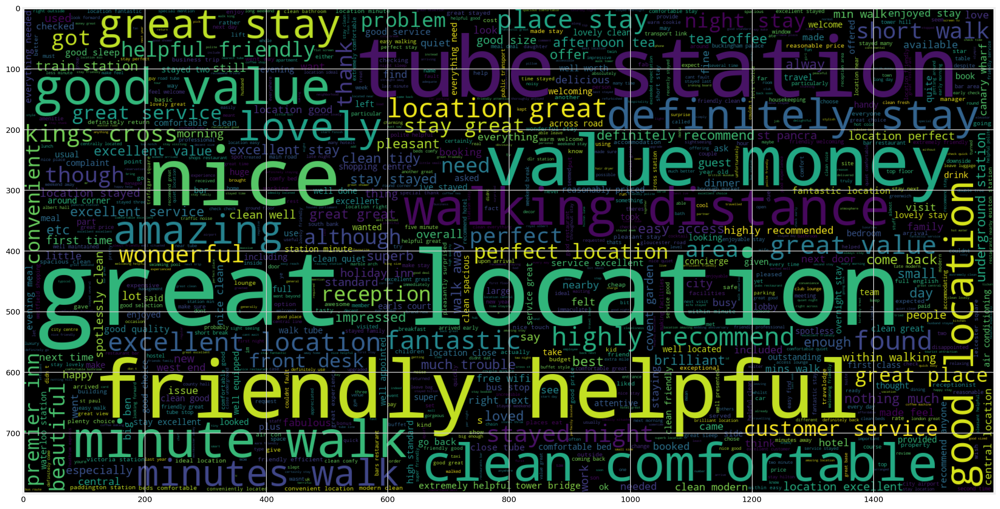

In [109]:
# 5 star review wordcloud
plt.figure(figsize=(20, 20))
wc = WordCloud(max_words=1000, width=1600, height=800).generate(" ".join(df_review_wordcloud[df_review_wordcloud.review_score==5]['review_title_body'].values))
plt.imshow(wc)

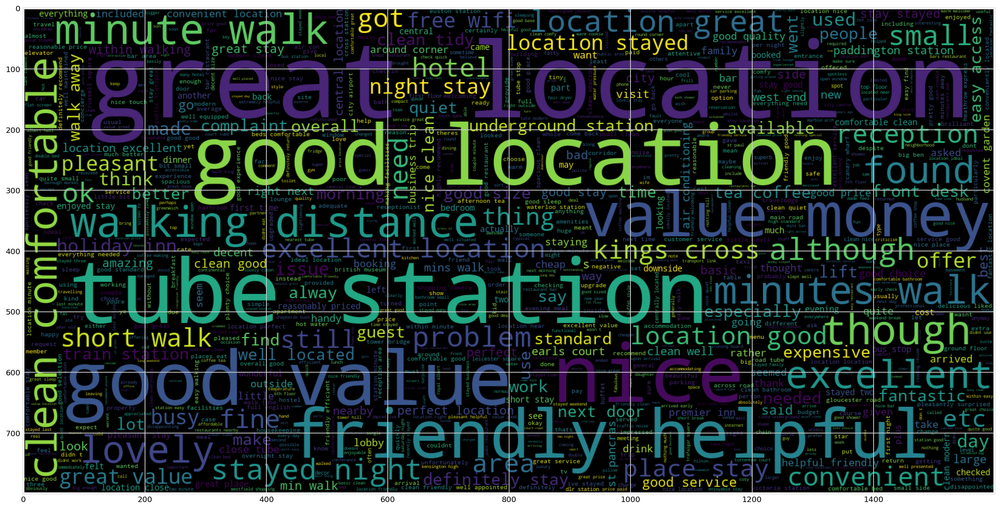

In [110]:
# 4 star review wordcloud
plt.figure(figsize=(20, 20))
wc = WordCloud(max_words=1000, width=1600, height=800).generate(" ".join(df_review_wordcloud[df_review_wordcloud.review_score==4]['review_title_body'].values))
plt.imshow(wc)

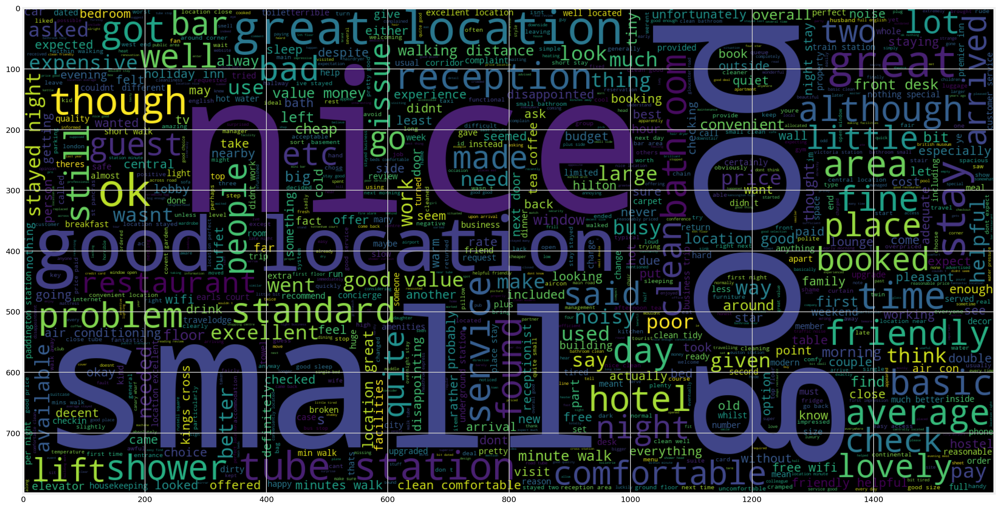

In [111]:
# 3 star review wordcloud
plt.figure(figsize=(20, 20))
wc = WordCloud(max_words=1000, width=1600, height=800).generate(" ".join(df_review_wordcloud[df_review_wordcloud.review_score==3]['review_title_body'].values))
plt.imshow(wc)

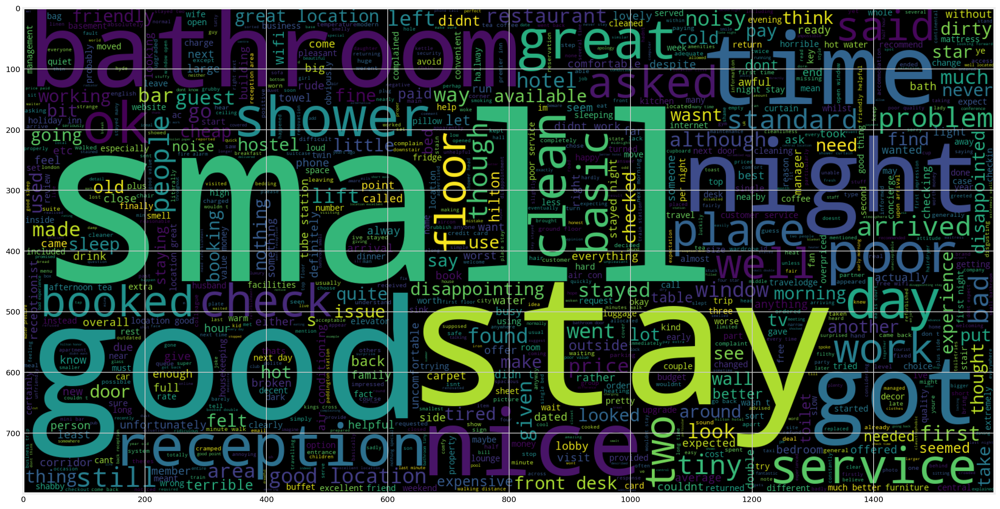

In [112]:
# 2 star review wordcloud
plt.figure(figsize=(20, 20))
wc = WordCloud(max_words=1000, width=1600, height=800).generate(" ".join(df_review_wordcloud[df_review_wordcloud.review_score==2]['review_title_body'].values))
plt.imshow(wc)

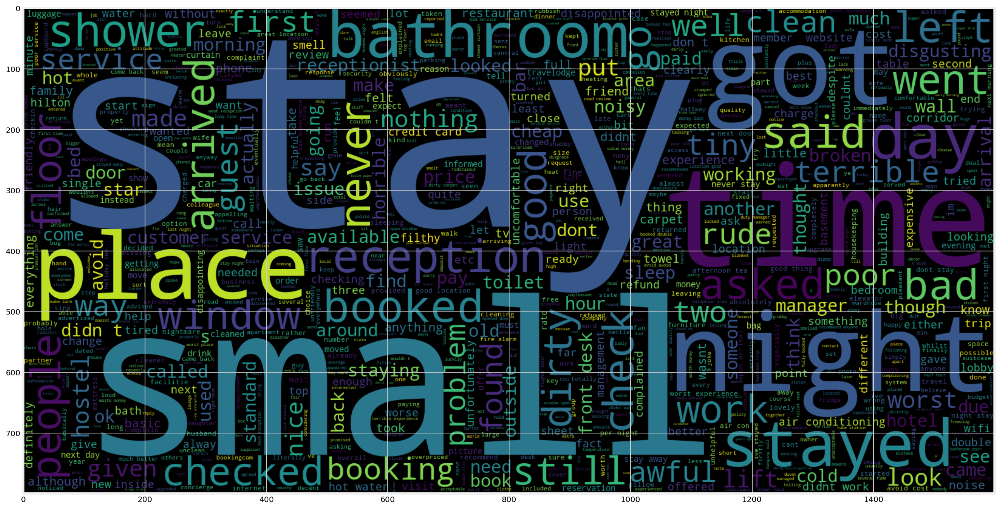

In [113]:
# 1 star review wordcloud
plt.figure(figsize=(20, 20))
wc = WordCloud(max_words=1000, width=1600, height=800).generate(" ".join(df_review_wordcloud[df_review_wordcloud.review_score==1]['review_title_body'].values))
plt.imshow(wc)

<a name='best_final_results'></a>
### 5.4 Final results from best model

In [27]:
# best models:
RFC_best = joblib.load('models/gs_pipeline_hb_rfc_tfidf_all_25_50.jlib')
NB_best = joblib.load('models/gs_MultiNB_cvec_st_ngram_mf_001.jlib')
Lr_best = joblib.load('models/gs_pipeline_hb_lr_tfidf_all.jlib')
DTC_best = joblib.load('models/gs_DTC_cvec_mf_1000_dep_30.jlib')

pd.DataFrame([Lr_best.best_score_, DTC_best.best_score_, NB_best.best_score_, RFC_best.best_score_], 
             index=['LogisticRegression', 'DecTreeClass', 'NaiveBayes', 'RandomForest'], 
            columns=['mean_cv_score']).sort_values(by='mean_cv_score', ascending=False)

C:\Users\mqsil\anaconda3\lib\site-packages\sklearn\base.py:310: UserWarning: Trying to unpickle estimator CountVectorizer from version 0.24.1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
C:\Users\mqsil\anaconda3\lib\site-packages\sklearn\base.py:310: UserWarning: Trying to unpickle estimator TfidfTransformer from version 0.24.1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
C:\Users\mqsil\anaconda3\lib\site-packages\sklearn\base.py:310: UserWarning: Trying to unpickle estimator DecisionTreeClassifier from version 0.24.1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
C:\Users\mqsil\anaconda3\lib\site-packages\sklearn\base.py:310: UserWarning: Trying to unpickle estimator RandomForestClassifier from version 0.24.1 when using version 0.24.2. This might lead to breaking code 

,mean_cv_score
LogisticRegression,0.628483
NaiveBayes,0.613194
RandomForest,0.576927
DecTreeClass,0.483156


In [118]:
# pick best model and save as best_model
best_model = Lr_best.best_estimator_

In [117]:
# show results from fitter funtion
fitter(best_model, X_train.review_title_body, y_train, X_test.review_title_body, y_test, cv_score=False)

Training Score: 0.6567190549563431
Test Score: 0.6560876996910131

[[15406  3662   503    89    64]
 [ 3547 10723  2844   258    96]
 [ 1769  7255 21631  6064   896]
 [  531  2017 12362 44463 18432]
 [  384   533  2020 20220 67606]]

              precision    recall  f1-score   support

         1.0       0.71      0.78      0.74     19724
         2.0       0.44      0.61      0.51     17468
         3.0       0.55      0.58      0.56     37615
         4.0       0.63      0.57      0.60     77805
         5.0       0.78      0.74      0.76     90763

    accuracy                           0.66    243375
   macro avg       0.62      0.66      0.64    243375
weighted avg       0.66      0.66      0.66    243375


[[ 3858   924   123    15    11]
 [  852  2676   733    78    28]
 [  462  1814  5330  1551   247]
 [  123   493  3099 11093  4643]
 [  101   138   512  4978 16962]]

              precision    recall  f1-score   support

         1.0       0.71      0.78      0.75      4931


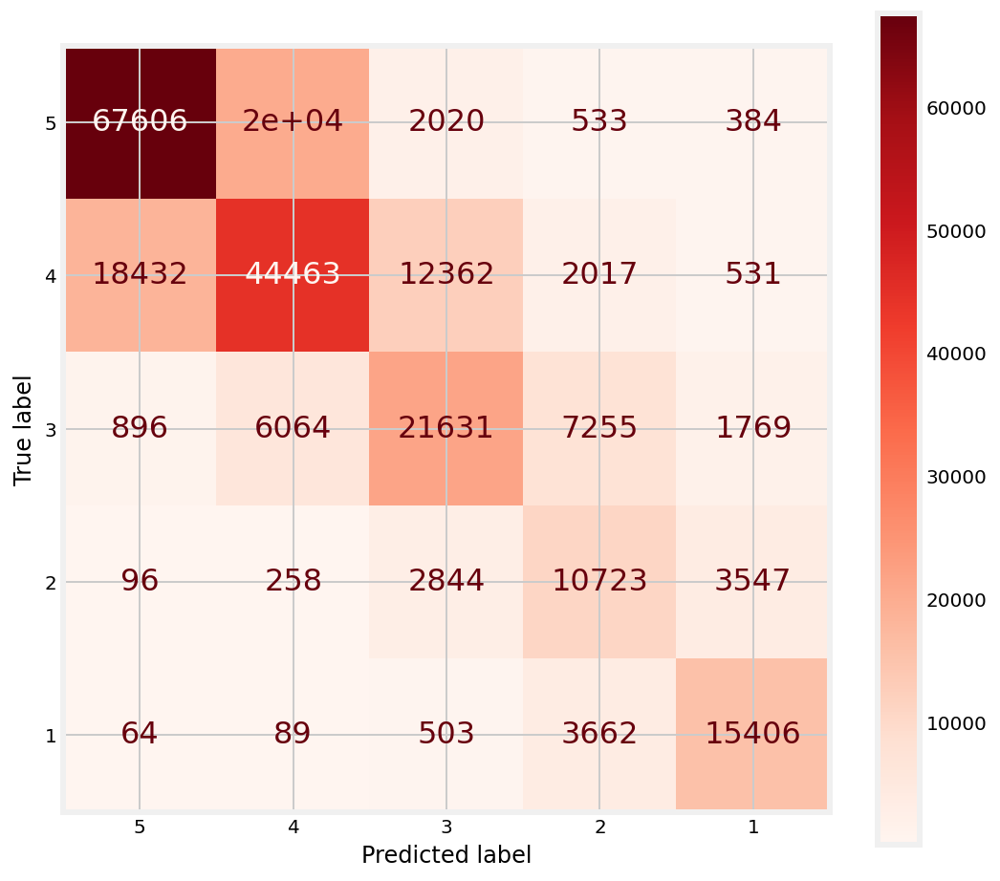

In [119]:
# show confusion matrix on training set graphically
fig, ax = plt.subplots(figsize=(8, 8))
plot_confusion_matrix(best_model, X_train.review_title_body, y_train, labels=[5, 4, 3, 2, 1], cmap='Reds', ax=ax)

texts = ax.texts
for text in texts:
    text.set_size(16)

plt.show()

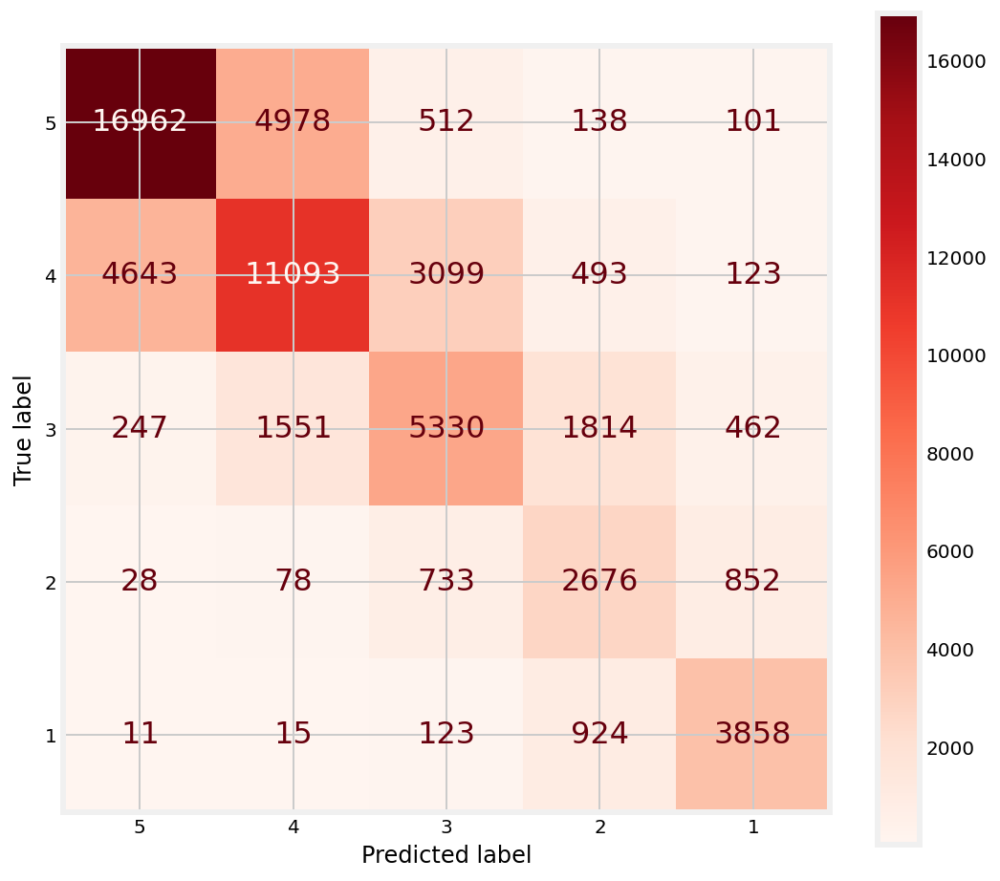

In [122]:
# show confusion matrix on test set graphically
fig, ax = plt.subplots(figsize=(8, 8))
plot_confusion_matrix(best_model, X_test.review_title_body, y_test, labels=[5, 4, 3, 2, 1], cmap='Reds', ax=ax)

texts = ax.texts
for text in texts:
    text.set_size(16)

plt.show()

<a name='best_pr_roc'></a>
#### 5.4.1 Precision-Recall and ROC plots for best model

In [123]:
# use scikitplot library for plotting

import scikitplot as skplt
from matplotlib.colors import ListedColormap
cmap = ListedColormap(sns.color_palette("husl", 3))

In [124]:
# create a function to plot lines os constant f1 on precision-recall plot
def plot_f1_lines(figsize=(12,8),fontsize=16):
    '''Create f1-score level lines to be added to the precison-recall plot'''

    fig, ax = plt.subplots(figsize=figsize)
    
    # add lines of constant F1 scores
    
    for const in np.linspace(0.2,0.9,8):
        x_vals = np.linspace(0.001, 0.999, 100)
        y_vals = 1./(2./const-1./x_vals)
        ax.plot(x_vals[y_vals > 0], y_vals[y_vals > 0],
                 color='lightblue', ls='--', alpha=0.9)
        ax.set_ylim([0, 1])
        ax.annotate('f1={0:0.1f}'.format(const),
                     xy=(x_vals[-10], y_vals[-2]+0.0), fontsize=fontsize)

    return fig, ax

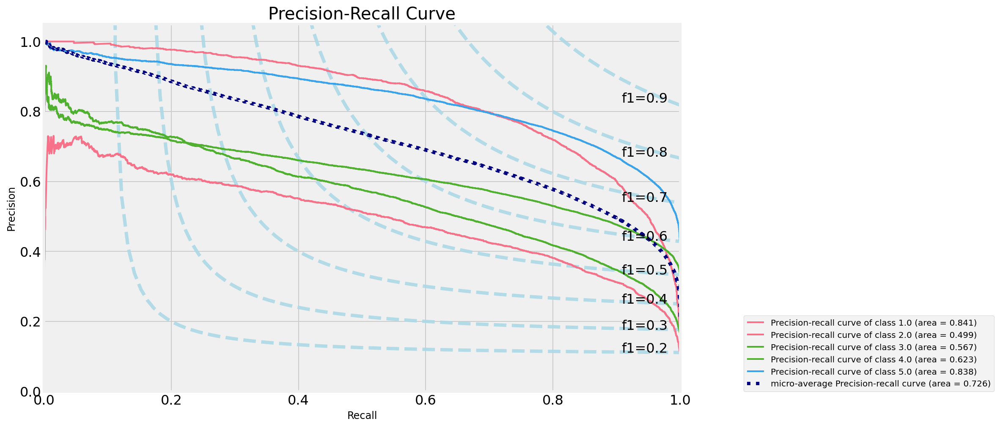

In [125]:
# plot precision-recall curve

# get the predicted probabilities from best model
probabilities_best_test = best_model.predict_proba(X_test.review_title_body)

# add constant f1 lines to plot
fig, ax = plot_f1_lines()

# plot curves
skplt.metrics.plot_precision_recall(y_test, probabilities_best_test, 
                       plot_micro=True, 
                       title_fontsize=20, text_fontsize=16, cmap=cmap, ax=ax)
ax.legend(loc=[1.1,0])
plt.show()

The precision-recall curve is a nice way we can see graphically what the confusion matrices are suggesting above. This is a precision recall curve for the different classes on the test data set. The area under the curves for the different classes suggests here that the model is a better predictor generally over the range of thresholds of estimating the extreme classes 1 and 5 relative to the rest. The worst performing class being the 2 star class. This makes intuitive sense as many people giving the 1 or 5 star reviews are more likely to be using more extreme language in their reviews such as "outstanding" of "awful" and "terrible" which the model will find easier to pick up and differentiate from the other classes. 

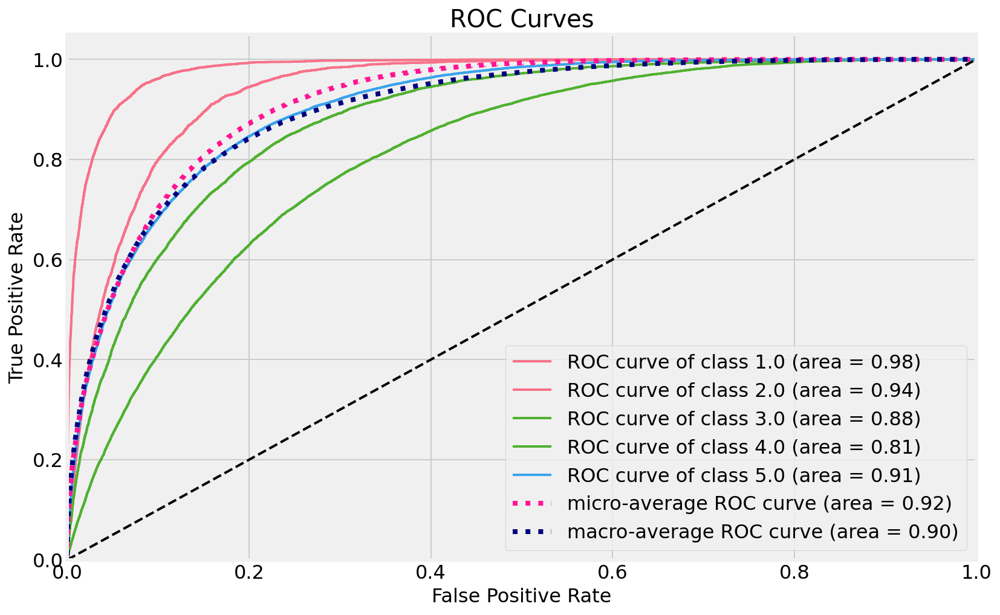

In [30]:
# plot ROC curve
skplt.metrics.plot_roc(y_test, probabilities_best_test, plot_micro=True, plot_macro=True, 
                       title_fontsize=20, text_fontsize=16, figsize=(12,8), cmap=cmap)
plt.show()

Given the fact the data set is relatively imbalanced, the ROC curves may not be the best thing to use to visualise these results (relative to the precision-recall). This is because of the of True Negatives (TN) is used in the denominator when calculating the False Positive Rate (FRP = FP / (FP + TN)) which will then be a relatively small number. The number of TN's heavily outnumber the positive samples, especially for the lower star rated classes (1 & 2) where the relative sample size is small. This will have the tendency to push the ROC curve to the left giving misleadingly high AUC scores. I think this is demonstrated here, particularly for classes 1 & 2 which shows very high AUC scores of 0.98 & 0.94 respectively (class 2 was the worst performing model on the precision-recall graph). I think the precision-recall graph gives a more useful measure of success of prediction of the model for the different classes.